In [1]:
import io
import os
import base64
from typing import Dict, List, Optional, Tuple, Union

import numpy as np
import pandas as pd
from tqdm.cli import tqdm

import matplotlib.pyplot as plt
import seaborn as sns
from PIL import Image
import plotly.express as px
from dash import Dash, dcc, html, Input, Output, no_update, callback
import cupy as cp
from transformers import AutoProcessor, AutoModel
from PIL import Image
import numpy as np
import plotly

from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
import torch
from transformers import ViTImageProcessor, ViTModel

sns.set_theme(style="darkgrid", palette="Set2")

---

Докажите, что метод KMeans для евклидовой метрики делит все пространство объектов на выпуклые многоугольники, возможно, неограниченные.

Можно использовать теоремы и свойства, которые у вас были ранее на обязательных курсах (но не курсах по выбору). При этом нужно привести четкое обоснование, как вы пользуетесь соответствующими свойствами, привести все обозначения.

Между двумя любыми кластерами граница будет определяться как $n - 1$-мерная плоскость ($n$ кластеров).  Т.к. между двумя точками ближайшая определяется тем, в каком полупространстве относительно плоскости, которая строится как перпендикулярная отрезку соединяющему центры через середину этого отрезка. Таким образом границы кластера определяются пересечением полуплоскостей, которые отделяют центр данного кластера от каждого из остальных центров. Любое $n - 1$-мерное полупространство выпукло и пересечение выпуклых многоугольников тоже всегда выпукло. Это значит что любой кластер является выпуклым многоугольником.

---

В этой задаче предлагается промоделировать ситуацию понижения размерности. Сгенерируйте достаточно большое количество точек в единичном кубе в пространстве некоторой размерности. 

In [3]:
def generate (dimention):
    sample_size = 1000
    return np.random.uniform(low=0, high=1,size=(sample_size, dimention))

Повторите генерацию для нескольких размерностей пространства от 2 до 1000. Используйте не менее 7 различных значений размерностей пространства.

In [4]:
dimensions = [2, 5, 10, 20, 50, 100, 200, 500, 1000]
points = {d: generate(d) for d in dimensions}

In [5]:
def compute_norms(points):
    norms = np.linalg.norm(points, axis=1)
    mean_norm = np.mean(norms)
    norms = norms / mean_norm
    return norms

In [6]:
norms = {d: compute_norms(points[d]) for d in dimensions}

Нарисуйте на одном графике гистограммы или KDE-оценки плотности</a> нормированных расстояний для каждой размерности пространства.

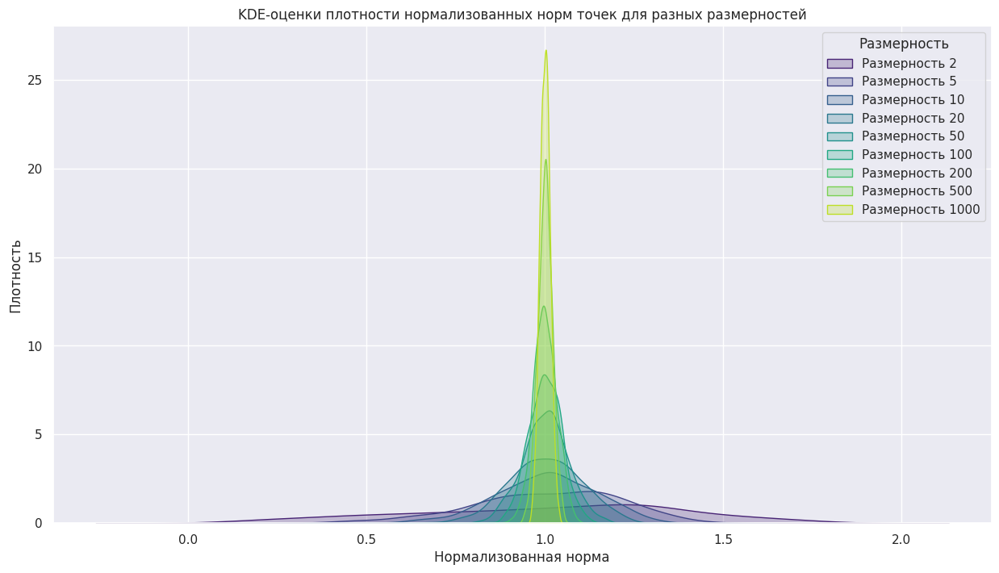

In [7]:
plt.figure(figsize=(15, 8))
palette = sns.color_palette("viridis", len(dimensions))
for i, d in enumerate(dimensions):
    sns.kdeplot(norms[d], label=f'Размерность {d}', color=palette[i], fill=True)
plt.title('KDE-оценки плотности нормализованных норм точек для разных размерностей')
plt.xlabel('Нормализованная норма')
plt.ylabel('Плотность')
plt.legend(title='Размерность')

plt.show()

По графику видно, что чем больше становится размерность, тем уже разброс норм и для низких размерностей можно заметить смещение вправо пика. Для больших размерностей диапазон норм очень узкий и пик очень высокий. Получается что при больших размерностях нет особого смысла в расстояниях между точками, потому что они все примерно одинаковые. Вроде это и есть "проклятие размерности".

---


В этой задаче мы попробуем кластеризовать различными способами изображения котиков из датасета с семинара.


Размерность cats: (15747, 12288)


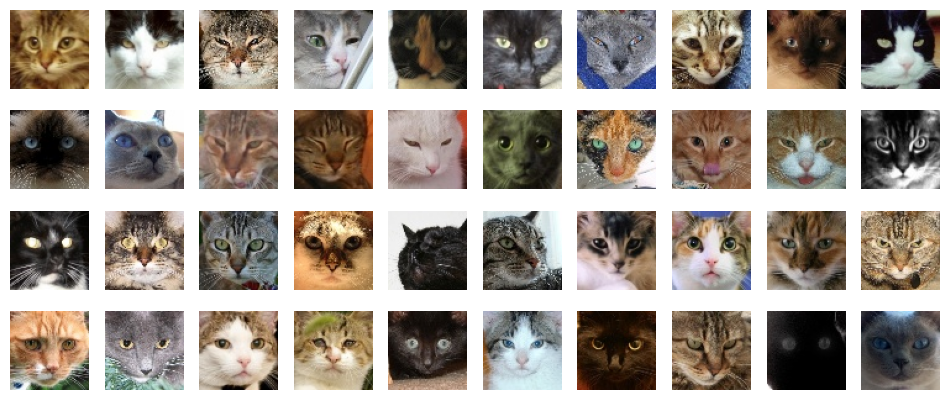

In [2]:
cats_path = "cats"
cats = []

for filename in os.listdir(cats_path):
    cats.append(plt.imread(os.path.join(cats_path, filename)))

cats = np.stack(cats).reshape(-1, 64 * 64 * 3)
print(f"Размерность cats: {cats.shape}")

plt.figure(figsize=(12, 5))
for i in range(40):
    plt.subplot(4, 10, i + 1)
    plt.imshow(cats[i].reshape(64, 64, 3))
    plt.axis("off")

#### Свойства метрики в пространстве котиков

Прежде всего давайте исследуем, наблюдается ли проблема проклятия размерности в пространстве котиков, фактически повторив исследование предыдущей задачи. 

Повторите те же действия к результату применения PCA, рассмотрев разное количество компонент.

In [9]:
num_pairs = 10000
indices = np.random.choice(len(cats), size=(num_pairs, 2), replace=True)

diffs = cats[indices[:, 0]] - cats[indices[:, 1]]
distances = np.linalg.norm(diffs, axis=1)
distances_norm_1 = distances / np.mean(distances)

In [10]:
dimensions = [30, 100, 500]
distance_distributions = {}

for d in dimensions:
    pca = PCA(n_components=d)
    proj = pca.fit_transform(cats.astype(np.float32))

    num_pairs = 10000
    indices = np.random.choice(len(proj), size=(num_pairs, 2), replace=True)
    diffs = proj[indices[:, 0]] - proj[indices[:, 1]]
    distances = np.linalg.norm(diffs, axis=1)
    distances_norm = distances / np.mean(distances)

    distance_distributions[d] = distances_norm

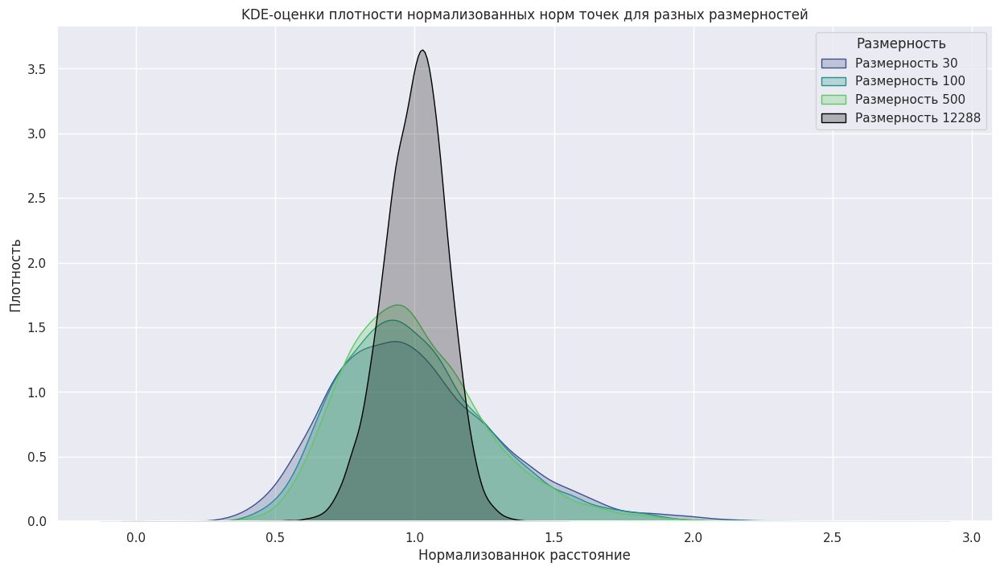

In [11]:
plt.figure(figsize=(15, 8))
palette = sns.color_palette("viridis", len(dimensions))
for i, d in enumerate(dimensions):
    sns.kdeplot(distance_distributions[d], label=f'Размерность {d}', color=palette[i], fill=True)
sns.kdeplot(distances_norm_1, label=f'Размерность 12288', color='black', fill=True)
plt.title('KDE-оценки плотности нормализованных норм точек для разных размерностей')
plt.xlabel('Нормализованнок расстояние')
plt.ylabel('Плотность')
plt.legend(title='Размерность')

plt.show()

Тут можно заметить проклятие размерности, при росте размерности пики становятся больше, а разброс меньше. Но тут на мой взгляд при увеличении размерности пики становятся выше не настолько быстро. Поэтому можно не снижать размерность, мне кажется.

#### Кластеризация котиков по вектору изображения

Начнем эксперименты с самого простого способа: каждое изображение можно вытянуть в вектор и попытаемся кластеризовать. Обучите по этим объектам метод KMeans из sklearn.

In [12]:
%%time
cats_gpu = cp.asarray(cats.astype(cp.float32))
cats_cpu = cp.asnumpy(cats_gpu)

n_clusters = 10
kmeans = KMeans(n_clusters=n_clusters, random_state=42)
labels = kmeans.fit_predict(cats_cpu)

CPU times: user 32.4 s, sys: 4.19 s, total: 36.6 s
Wall time: 28.3 s


Теперь отобразим изображения на плоскость с помощью PCA и визуализируем полученные предсказания цветом. Ниже уже реализована функция отрисовки `visualize_images_clusterisation`, вам требуется лишь применить PCA и вызвать функцию с правильными параметрами.

У меня с colabом почему-то ничего не получается, я сохраняю графики в html.

In [3]:
def visualize_images_clusterisation(
    images: np.ndarray,
    projection: np.ndarray,
    clusters: np.ndarray,
    port: Optional[int] = None,
    use_dash: bool = False,
) -> Optional[Dash]:
    """
    Визуализирует кластеризацию изображений с возможностью просмотра изображений при наведении.

    Создает интерактивный scatter plot проекции изображений с двумя режимами:
    1. Режим Jupyter (use_dash=False): показывает статичный plotly график
    2. Режим Dash (use_dash=True): запускает интерактивный сервер с hover-эффектом

    Параметры:
        images: Массив изображений формы (n_samples, height, width, channels)
        projection: 2D проекция эмбеддингов формы (n_samples, 2)
        clusters: Массив меток кластеров формы (n_samples,)
        port: Порт для запуска Dash-приложения (None - случайный порт)
        use_dash: Флаг использования интерактивного Dash-режима

    Возвращает:
        При use_dash=True возвращает Dash приложение, иначе None
    """

    plotly.offline.init_notebook_mode()

    # Рисуем график с точками как на семинаре
    fig = px.scatter(
        x=projection[:, 0],
        y=projection[:, 1],
        hover_name=clusters,
        hover_data={"image_idx": list(range(len(images)))},
        color=clusters.astype(str),
        width=1000,
        height=800,
        title="PCA проекция изображений на плоскость",
        size=[1] * len(images),
        size_max=12,
    )

    if not use_dash:
        fig.write_html("clusters_visualization.html")
        return

    # Добавляем во всплывающее окошко (hover box) изображения
    fig.update_traces(
        hoverinfo="none",
        hovertemplate=None,
    )

    app = Dash(__name__)

    app.layout = html.Div(
        className="container",
        children=[
            dcc.Graph(id="graph-2-dcc", figure=fig, clear_on_unhover=True),
            dcc.Tooltip(id="graph-tooltip-2", direction="bottom"),
        ],
    )

    @callback(
        Output("graph-tooltip-2", "show"),
        Output("graph-tooltip-2", "bbox"),
        Output("graph-tooltip-2", "children"),
        Output("graph-tooltip-2", "direction"),
        Input("graph-2-dcc", "hoverData"),
    )
    def display_hover(
        hoverData: Optional[Dict],
    ) -> Tuple[bool, Union[Dict, str], List[html.Img], str]:
        """
        Callback функция для обработки hover-событий и отображения изображений во всплывающем окне.

        Параметры:
            hoverData: Данные о точке, на которую наведен курсор. Содержит:
                      - coordinates (координаты точки)
                      - pointIndex (индекс точки)
                      - bbox (границы точки)
                      - customdata (дополнительные данные)

        Возвращает кортеж:
            1. Флаг показа/скрытия tooltip (bool)
            2. Bounding box точки (dict) или no_update
            3. Список HTML-элементов для отображения (List[html.Img])
            4. Направление отображения tooltip (str)
        """
        if hoverData is None:
            return False, no_update, no_update, no_update

        # Достаем индекс картинки, который выше положили в hover_data
        hover_data = hoverData["points"][0]
        image_idx = hover_data["customdata"][0]
        # И получаем само изображение кота
        image = Image.fromarray(images[image_idx].reshape(64, 64, 3))

        # Преобразовываем изображение в base64 кодировку
        buffer = io.BytesIO()
        image.save(buffer, format="jpeg")
        encoded_image = base64.b64encode(buffer.getvalue()).decode()
        image_url = "data:image/jpeg;base64, " + encoded_image

        image_children = [
            html.Img(
                src=image_url,
                style={"width": "196px"},
            ),
        ]

        return True, hover_data["bbox"], image_children, "top"

    if port is None:
        port = str(np.random.randint(5000, 15000))
    app.run(port=port, debug=True, jupyter_height=800)

    return app

In [ ]:
pca = PCA(n_components=2)
projection = pca.fit_transform(cats_cpu)
cats_reshaped = cats.reshape(-1, 64, 64, 3)

visualize_images_clusterisation(
    images=cats_reshaped,
    projection=projection,
    clusters=labels,
    use_dash=False
)
# файл clusters_2.html

Для каждого кластера нарисуйте по 5-10 типичных изображений, то есть ближайших к центру кластера.

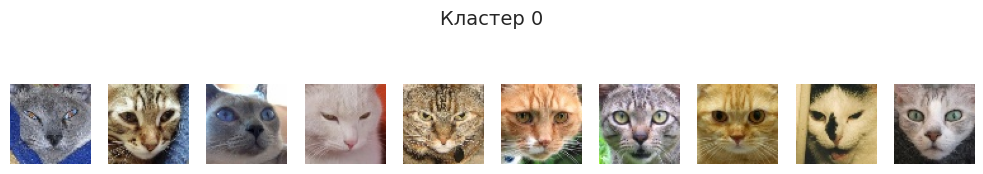

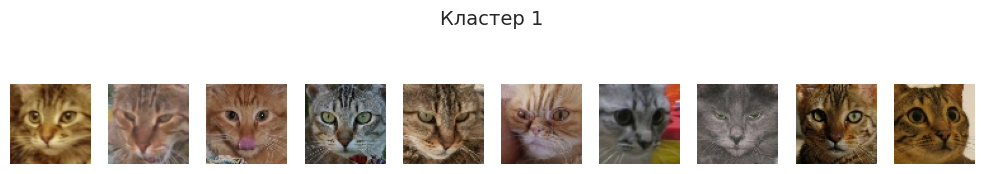

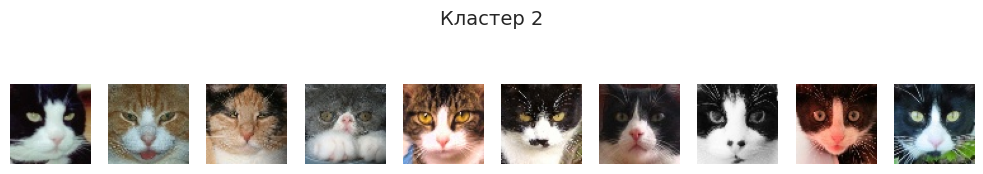

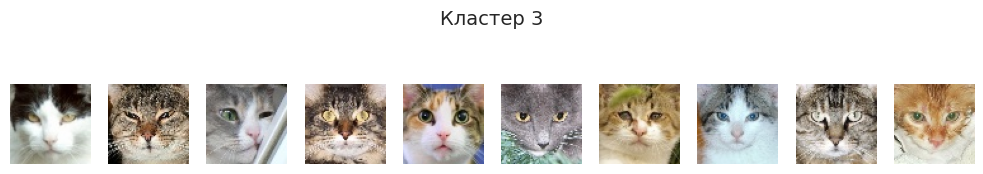

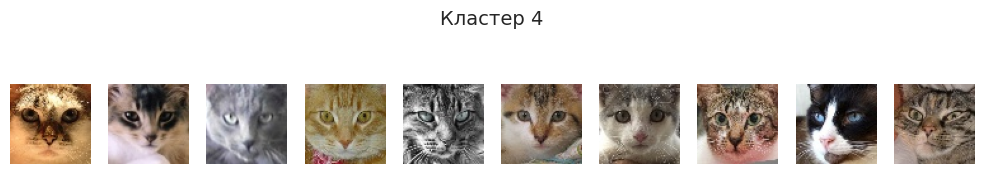

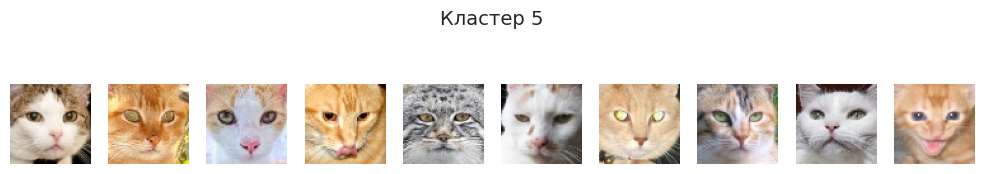

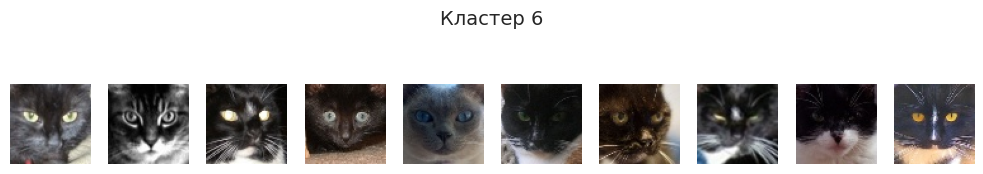

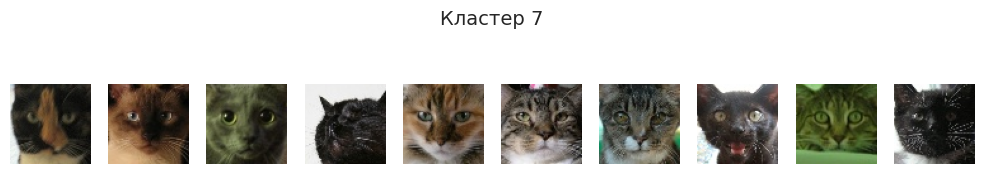

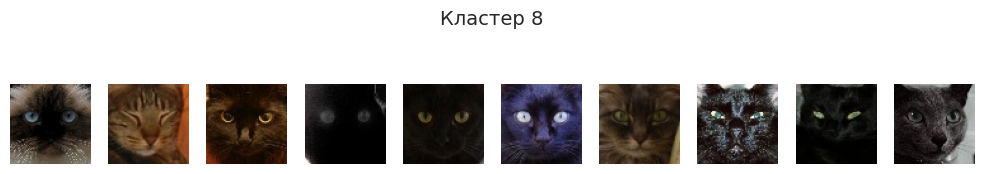

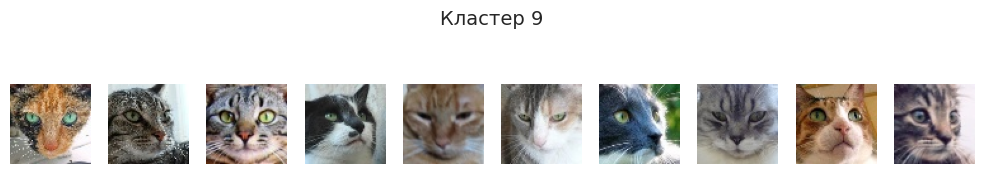

In [15]:
for cluster_id in range(n_clusters):
    cluster_indices = np.where(labels == cluster_id)[0]

    sample_indices = cluster_indices[:10]
    sample_images = cats[sample_indices]

    plt.figure(figsize=(10, 2))
    plt.suptitle(f"Кластер {cluster_id}", fontsize=14)

    for i, img in enumerate(sample_images):
        img = img.reshape((64, 64, 3))
        plt.subplot(1, 10, i + 1)
        plt.imshow(img.astype(np.uint8))
        plt.axis("off")

    plt.tight_layout()
    plt.show()


В некоторых кластерах сразу видно закономерности, для некоторых я не могу определить.  
0 - не знаю  
1 - похоже вертикальны еполоски на лбе (но неточно)  
2 - область в виде перевернутой буквы т (рот и нос одного цвета, остальное другого)  
3 - не знаю  
4 - не знаю   
5 - кажется рыжие котики, но не все  
6 - темные котики  
7 - не знаю..  
8 - очень ярко выделяются глаза  
9 - я нинаю..

Кластеры получились не очень хорошие, потому что для многих из них нельзя сказать по какому признаку объединяются картинки. Видимо всё-таки есть проблема с слишком большой размерностью, хотя мне казалось, что разброс будет достаточным.

####  PCA + кластеризация

Попробуем уменьшить размерность перед кластеризацией с помощью PCA, спроектировав изображения на первые несколько главных компонент


In [ ]:
%%time
pca = PCA(n_components=100)
cats_projection = pca.fit_transform(cats)

cats_gpu_projection = cp.asarray(cats_projection.astype(cp.float32))
cats_cpu_projection = cp.asnumpy(cats_gpu_projection)

kmeans = KMeans(n_clusters=n_clusters, random_state=42)
labels = kmeans.fit_predict(cats_cpu_projection)

CPU times: user 46.3 s, sys: 670 ms, total: 46.9 s
Wall time: 28.1 s


In [ ]:
pca = PCA(n_components=2)
projection = pca.fit_transform(cats_cpu_projection)

visualize_images_clusterisation(
    images=cats_reshaped,
    projection=projection,
    clusters=labels,
    use_dash=False
)
# файл clusters_3.html

Нарисуйте по 5-10 типичных изображений для новых кластеров

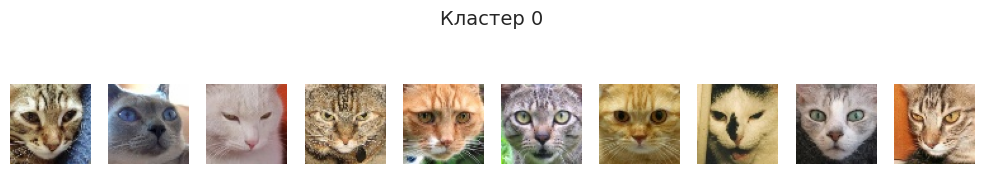

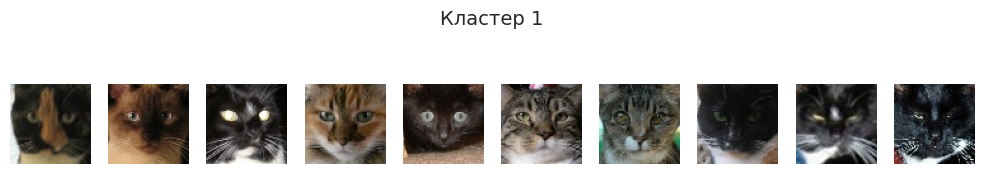

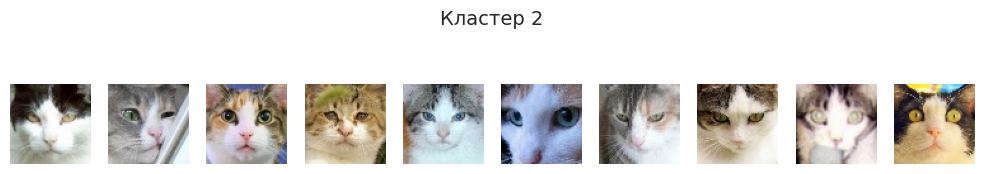

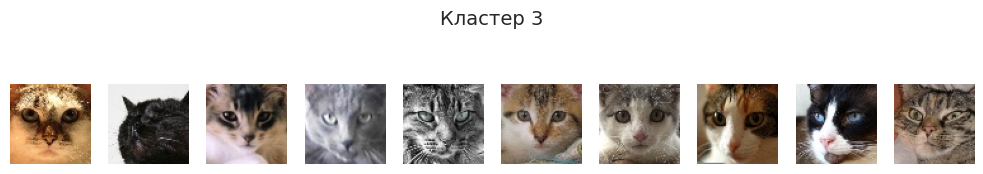

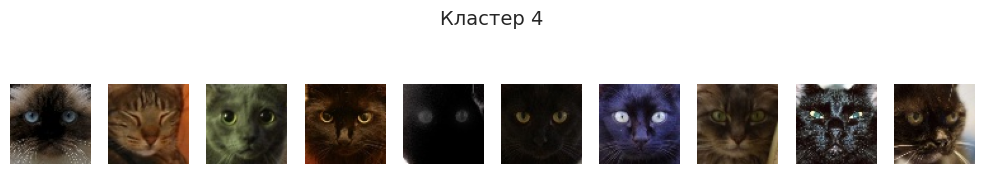

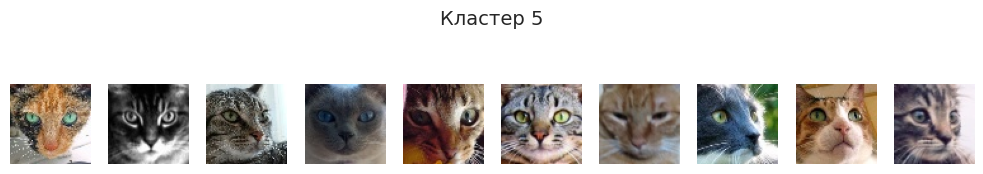

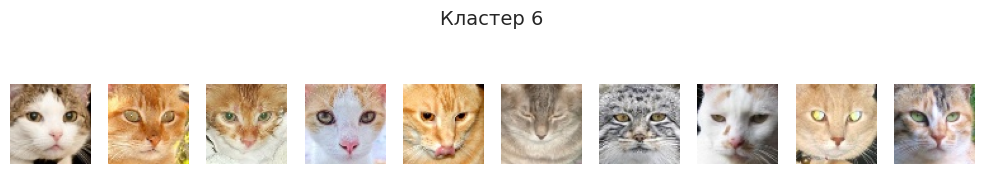

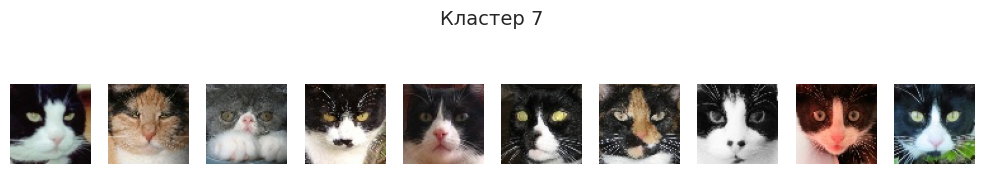

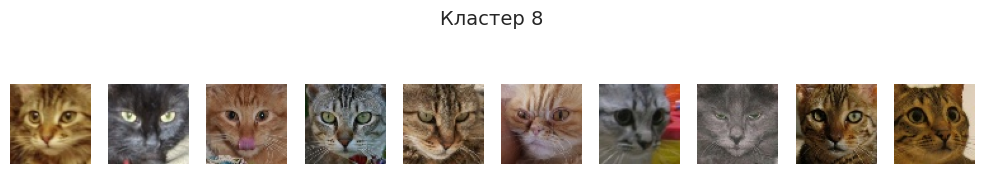

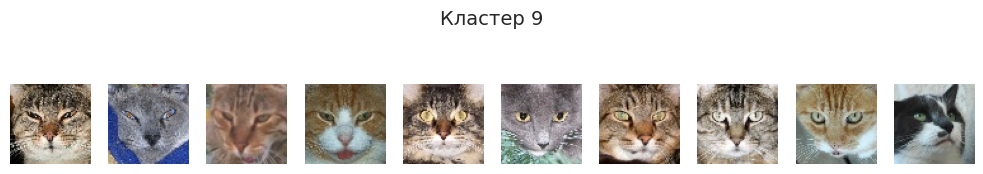

In [18]:
for cluster_id in range(n_clusters):
    cluster_indices = np.where(labels == cluster_id)[0]

    sample_indices = cluster_indices[:10]
    sample_images = cats[sample_indices]

    plt.figure(figsize=(10, 2))
    plt.suptitle(f"Кластер {cluster_id}", fontsize=14)

    for i, img in enumerate(sample_images):
        img = img.reshape((64, 64, 3))
        plt.subplot(1, 10, i + 1)
        plt.imshow(img.astype(np.uint8))
        plt.axis("off")

    plt.tight_layout()
    plt.show()

0 - не знаю  
1 - достаточно темные картинки  
2 - котики с белым пятном в видк перевернутой Т  
3 - не знаю  
4 - очень темные картинки на которых выделяются только глаза  
5 - не знаю  
6 - рыжие котики и такие у которых сколько-то рыжего есть (есть исключение, но я считаю его)  
7 - черные котики с белой Т  
8 - полосатые котики  
9 - полоски только на лбу  

В этот раз кластеризация сильно лучше визуально, по крайней мере я у большего числа кластеров вижу общие признаки. Довольно сложно ответить на вопрос сильно ли отличается, тк некоторые кластеры сильно схожи, а некоторые довольно сильно отличаются. Но мое предположение да, сильно отличается.

#### Нейросетевые эмбеддинги + кластеризация

Попробуем применить к изображениям такой же подход, как с текстами. То есть возьмем хорошую уже обученную нейросеть, получим с ее помощью эмбеддинги изображений и будем делать кластеризацию этих эмбеддингов.

Выберите на <a target="_top" href="https://huggingface.co/models">huggingface</a> модель для получения эмбеддингов изображений.

In [9]:
example_image = cats[0].reshape(64, 64, 3)

model_name = "facebook/dinov2-small"
processor = AutoProcessor.from_pretrained(model_name)
model = AutoModel.from_pretrained(model_name).to("cuda")

example_image_pil = Image.fromarray(example_image.astype(np.uint8))

inputs = processor(images=example_image_pil, return_tensors="pt").to("cuda")

with torch.no_grad():
    outputs = model(**inputs)

embeddings = outputs.last_hidden_state

embedding = embeddings.mean(dim=1)

print(f"Размерность эмбеддинга: {embedding.shape}")

Размерность эмбеддинга: torch.Size([1, 384])


Примените загруженную модель ко всем картинкам

In [10]:
def extract_embedding(image):
    e_image = image.reshape(64, 64, 3)
    e_image_pil = Image.fromarray(e_image.astype(np.uint8))
    inputs = processor(images=e_image_pil, return_tensors="pt").to("cuda")

    with torch.no_grad():
        outputs = model(**inputs)

    embeddings = outputs.last_hidden_state
    embedding = embeddings.mean(dim=1)

    return embeddings.mean(dim=1)

In [ ]:
embeddings_list = []
i = 0
for image in cats:
    i += 1
    if i % 10 == 0:
        print(i)
    embedding = extract_embedding(image)
    embeddings_list.append(embedding)

In [16]:
embeddings_array = np.stack([embedding.cpu().numpy() for embedding in embeddings_list])
embeddings_array = embeddings_array.squeeze(1)

Сделайте кластеризацию полученных эмбеддингов

In [ ]:
%%time

cats_gpu = cp.asarray(embeddings_array.astype(cp.float32))
cats_cpu = cp.asnumpy(cats_gpu)

kmeans = KMeans(n_clusters=n_clusters, random_state=42)
labels = kmeans.fit_predict(cats_cpu)

CPU times: user 992 ms, sys: 23.9 ms, total: 1.02 s
Wall time: 713 ms


In [ ]:
pca = PCA(n_components=2)
projection = pca.fit_transform(cats_cpu)
cats_reshaped = cats.reshape(-1, 64, 64, 3)

visualize_images_clusterisation(
    images=cats_reshaped,
    projection=projection,
    clusters=labels,
    use_dash=False
)
# файл clusters_4.html

Нарисуйте по 5-10 типичных изображений для новых кластеров

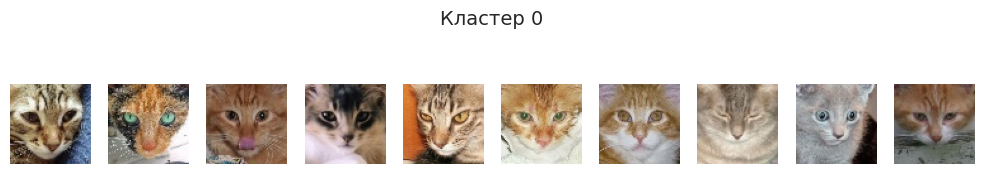

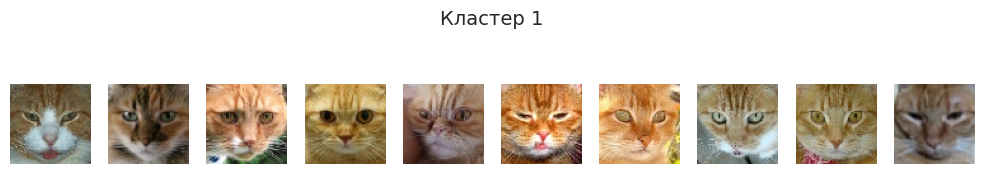

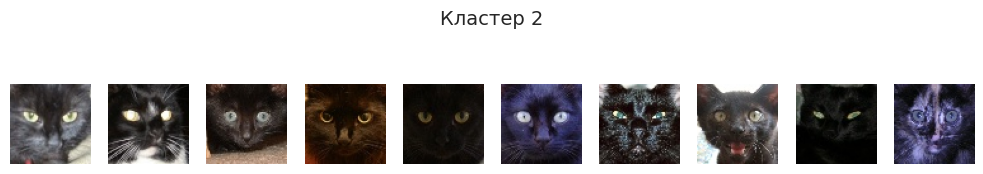

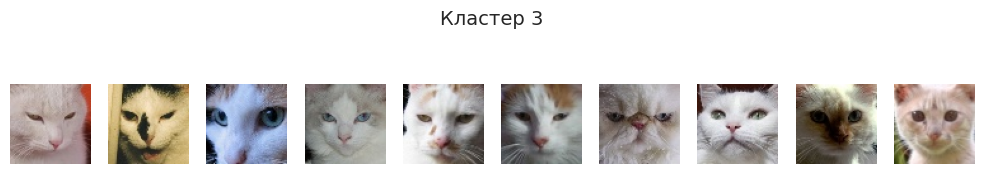

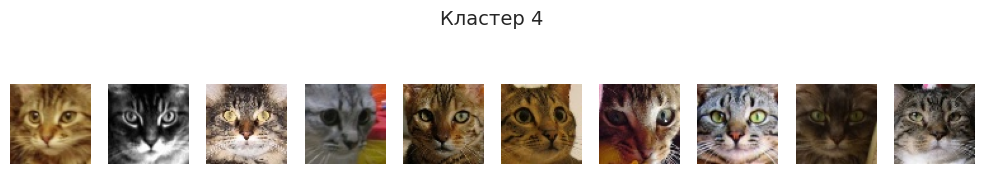

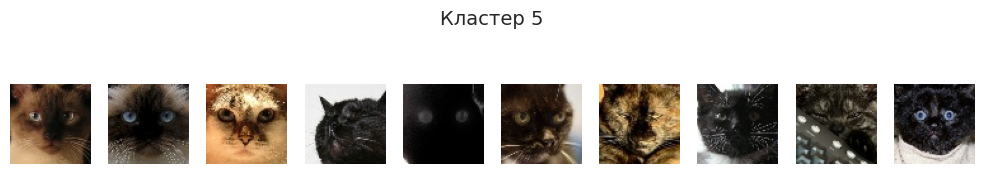

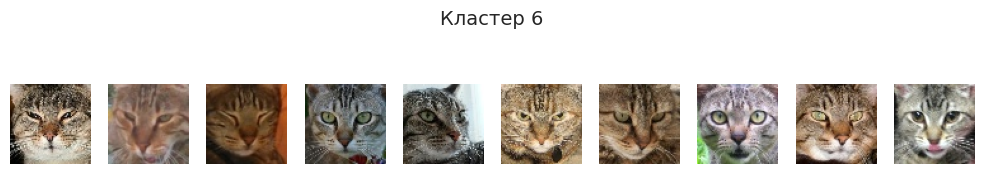

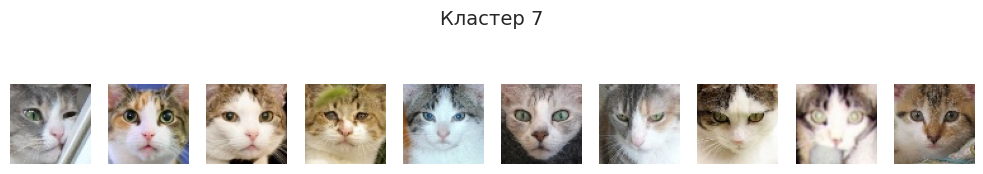

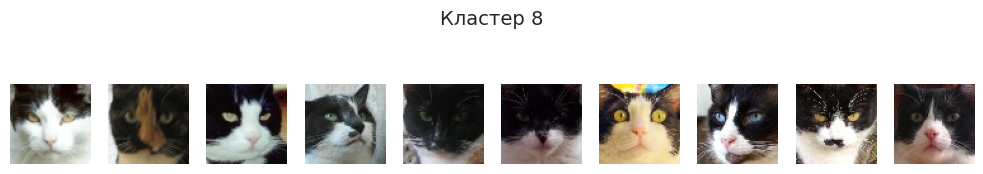

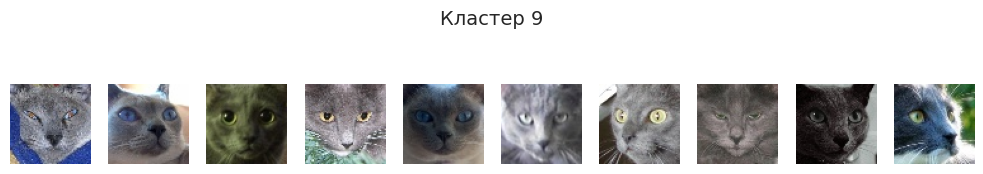

In [20]:
for cluster_id in range(n_clusters):
    cluster_indices = np.where(labels == cluster_id)[0]

    sample_indices = cluster_indices[:10]
    sample_images = cats[sample_indices]

    plt.figure(figsize=(10, 2))
    plt.suptitle(f"Кластер {cluster_id}", fontsize=14)

    for i, img in enumerate(sample_images):
        img = img.reshape((64, 64, 3))
        plt.subplot(1, 10, i + 1)
        plt.imshow(img.astype(np.uint8))
        plt.axis("off")

    plt.tight_layout()
    plt.show()


0 - не знаю  
1 - рыжие котики с вертикальными полосками на лбу  
2 - очень темные котики, у которых ярче всего выделяются глаза  
3 - белые котики  
4 - полосатые котики  
5 - не знаю  
6 - серые полосатые котики  
7 - светлые котики с белой нижней половиной лица  
8 - темные котики с белой нижней половиной лица  
9 - серые котики

Эти кластеры кажутся действительно хорошими. Почти для каждого кластера можно явно выделить признак и этот признак будет хорошо работать без сильных допущений, в отличие от предыдущих двух случаев. Также здесь появились новые виды кластеров (например полностью белые котики). Я считаю, что из всех кластеризаций по визуальному анализу эта самая хорошая.

#### Выводы

1. Не смотря на то, что разброс и высота пиков меняются не так резко, как в предыдущей задаче, тут все ещё работает проклятие размерности (первая кластеризация очень плохая, на мой взгляд).  
2. Если снижать размерность, то качество кластеризации улучшается (главное не переборщить и не оставить одну размерность).  
3. Возможно я разбиваю на слишком большое количество кластеров (некоторые из низ можно было бы объединить).  
4. На этих картинках лучше всего определяется пятно в нижней части мордочки (это практически единственное, что было во всех кластерезациях)
5. При использовании эмбендингов изобажения вместо него самого получается кластеризация лучше чем при использовании изображения.